In [8]:
pip install numpy==1.26.4

   ---------------------------------------- 0.0/15.8 MB ? eta -:--:--
   ------------------------------ --------- 12.1/15.8 MB 68.6 MB/s eta 0:00:01
   ---------------------------------------- 15.8/15.8 MB 62.2 MB/s  0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.6
    Uninstalling numpy-2.2.6:
      Successfully uninstalled numpy-2.2.6
Note: you may need to restart the kernel to use updated packages.


  You can safely remove it manually.
  You can safely remove it manually.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.


In [ ]:
pip install -e SimWorldGym

Obtaining file:///C:/gym_citynav/SimWorldGym
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Checking if build backend supports build_editable: started
  Checking if build backend supports build_editable: finished with status 'done'
  Getting requirements to build editable: started
  Getting requirements to build editable: finished with status 'done'
  Preparing editable metadata (pyproject.toml): started
  Preparing editable metadata (pyproject.toml): finished with status 'done'
  Cloning https://github.com/SimWorld-AI/SimWorld.git (to revision main) to c:\users\shadow\appdata\local\temp\pip-install-3n8x45kl\simworld_049a8b7f5b164e6d88afff5f7fbc3d87
  Resolved https://github.com/SimWorld-AI/SimWorld.git to commit c2e8ca0d15cfd1c6c9f29070919cc67dadbd60c6
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to buil

  Running command git clone --filter=blob:none --quiet https://github.com/SimWorld-AI/SimWorld.git 'C:\Users\Shadow\AppData\Local\Temp\pip-install-3n8x45kl\simworld_049a8b7f5b164e6d88afff5f7fbc3d87'


In [ ]:
pip install -r baseline/requirements.txt

Note: you may need to restart the kernel to use updated packages.


In [1]:
import gym
import simworld_gym
import os

ue_port = int(os.getenv('UE_PORT', '9000'))
print(ue_port)

9000


Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
Users of this version of Gym should be able to simply replace 'import gym' with 'import gymnasium as gym' in the vast majority of cases.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.


In [2]:
%cd baseline/single

c:\gym_citynav\baseline\single


In [3]:
# Define the reward_setting dictionary
reward_setting = {
    "human_collision_penalty": -1,  # Penalty for colliding with humans
    "object_collision_penalty": -0.1,  # Penalty for colliding with objects
    "action_penalty": -0.1,            # Penalty for each action (encourages shorter paths)
    "success_reward": 10.0,           # Reward for successfully reaching the goal
    "off_track_penalty": -0.01          # Penalty for going off track
}

model = "gpt-4o-mini"

# Use this reward_setting in gym.make
env = gym.make('simworld_gym/SimpleWorld',
               port=ue_port,
               resolution=(720, 600),
               render_mode="rgb_array",  
               observation_type="all",  
               record_video=False,
               log_dir=f"log_simple/{model}", 
               reward_setting=reward_setting,
               )

INFO:__init__:230:Got connection confirm: b'connected to gym_citynav'


=>Info: using ip-port socket


In [ ]:
import os
# Set your OpenAI API key (replace with your real key or rely on environment)
os.environ['OPENAI_API_KEY'] = os.getenv('OPENAI_API_KEY', 'YOUR_OPENAI_API_KEY')

In [5]:
from prompt_template import reasoning_template, perception_template
from agents import ReActAgent

# Perception configuration flags (keep simple for this baseline)
strip = False
depth = False
segment = False
backend = "openai"

# Instantiate ReasoningAgent similarly to single_exp usage
agent = ReActAgent(
    backend=backend,
    model=model,
    reasoning_prompt=reasoning_template(strip=strip),
    perception_prompt=perception_template(strip=strip, depth=depth, segment=segment),
)

Reset world
spawning_point: {'x': -43599.0159, 'y': -41700.0, 'z': 73.957685}
Agent's Camera ID: 1
Setting up camera 1
Reset agent


c:\Users\Shadow\miniconda3\envs\gym_citynav\lib\site-packages\gym\utils\passive_env_checker.py:165: UserWarning: WARN: The obs returned by the `reset()` method is not within the observation space.
  logger.warn(f"{pre} is not within the observation space.")


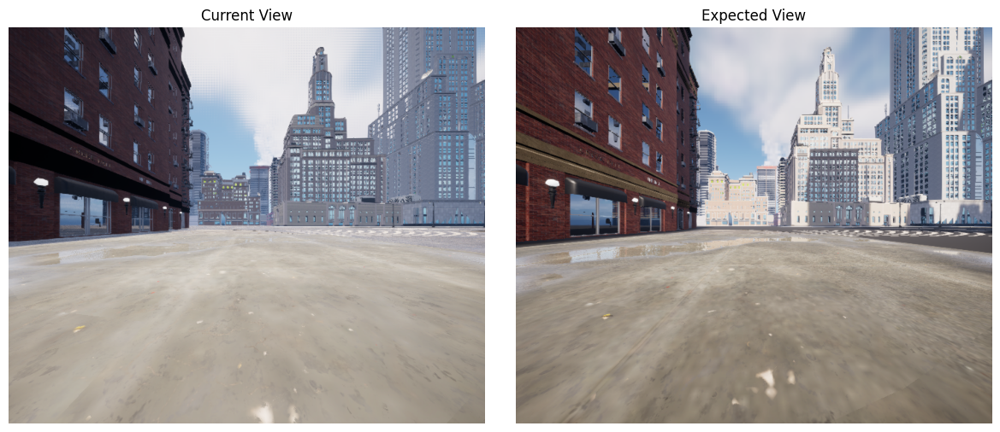

[vision] The current view shows a wide, open area with a smooth, slightly wet pavement reflecting the sky. To the left, there is a red-brick residential building characterized by its textured surface and multiple windows, which are framed in black. The building features large garage doors on the ground floor, indicating a functional space for vehicles. The right side of the view is dominated by taller, modern buildings with glass facades, showcasing a mix of architectural styles. The sky above is partly cloudy, with a light blue hue. There are no visible obstacles or intersections in the immediate vicinity, allowing for a clear line of sight. The expected view indicates that the red-brick building should be more prominent, with the garage doors clearly visible. The current view does not yet show the landmark, suggesting that the subtask of turning to face west is not yet complete.

=== Subtask Evaluation Information ===
Current subtask: 0
Evaluation criteria type: ORIENTATION
Current a

c:\Users\Shadow\miniconda3\envs\gym_citynav\lib\site-packages\gym\utils\passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):
c:\Users\Shadow\miniconda3\envs\gym_citynav\lib\site-packages\gym\utils\passive_env_checker.py:165: UserWarning: WARN: The obs returned by the `step()` method is not within the observation space.
  logger.warn(f"{pre} is not within the observation space.")


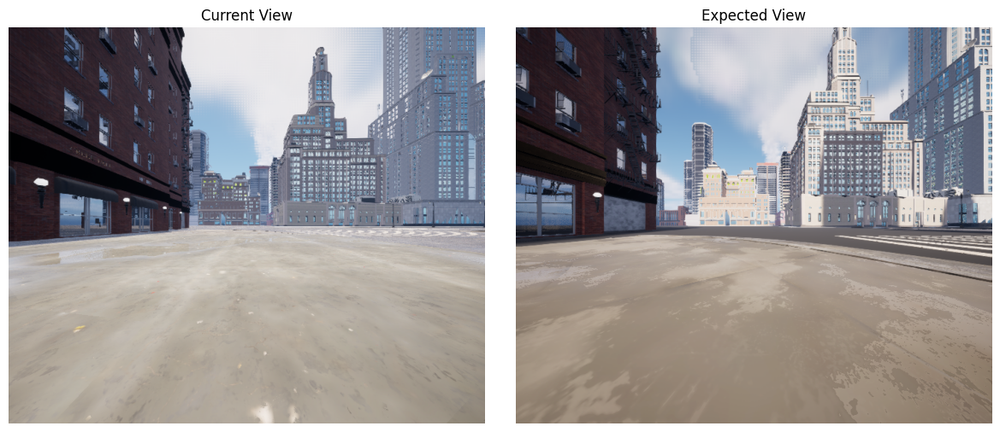

[vision] The current observation reveals a wide, open area with smooth, slightly wet pavement reflecting the sky. To the left, there is a red-brick residential building characterized by its textured surface and multiple black-framed windows. The building features large garage doors on the ground floor, indicating a functional space for vehicles. Wall-mounted lights are visible, enhancing the building's functionality. The right side of the view is dominated by taller, modern buildings with glass facades, showcasing a mix of architectural styles. The sky above is partly cloudy, with a light blue hue. There are no visible obstacles or intersections in the immediate vicinity, allowing for a clear line of sight. The expected view indicates that the red-brick building should be more prominent, with the garage doors clearly visible and the surrounding context matching the description of the high red brick and beige accented residential building featuring signs for 'MILLWORKS', 'CREEK DELI', a

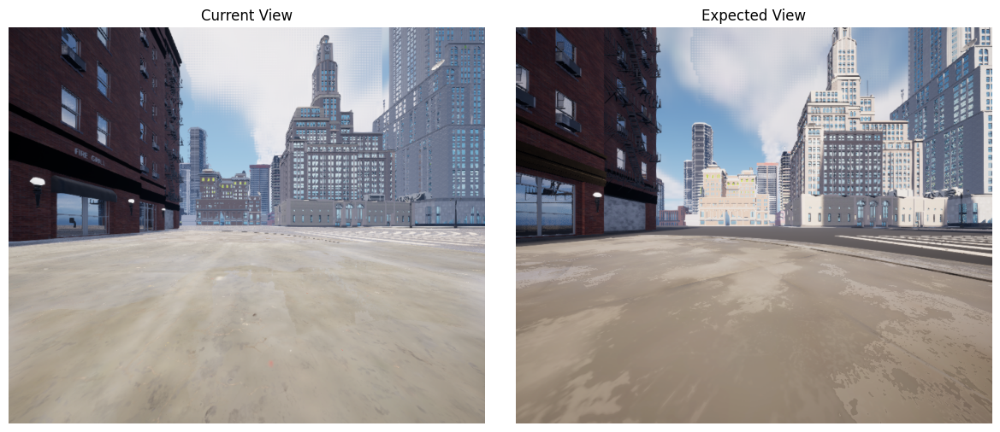

[vision] The current observation reveals a wide, open area with smooth, slightly wet pavement reflecting the sky. To the left, there is a red-brick residential building characterized by its textured surface and multiple black-framed windows. The building features large garage doors on the ground floor, indicating a functional space for vehicles. Wall-mounted lights are visible, enhancing the building's functionality. The right side of the view is dominated by taller, modern buildings with glass facades, showcasing a mix of architectural styles. The sky above is partly cloudy, with a light blue hue. There are no visible obstacles or intersections in the immediate vicinity, allowing for a clear line of sight. The expected view indicates that the red-brick building should be more prominent, with the garage doors clearly visible and the surrounding context matching the description of the high red brick and beige accented residential building featuring signs for 'MILLWORKS', 'CREEK DELI', a

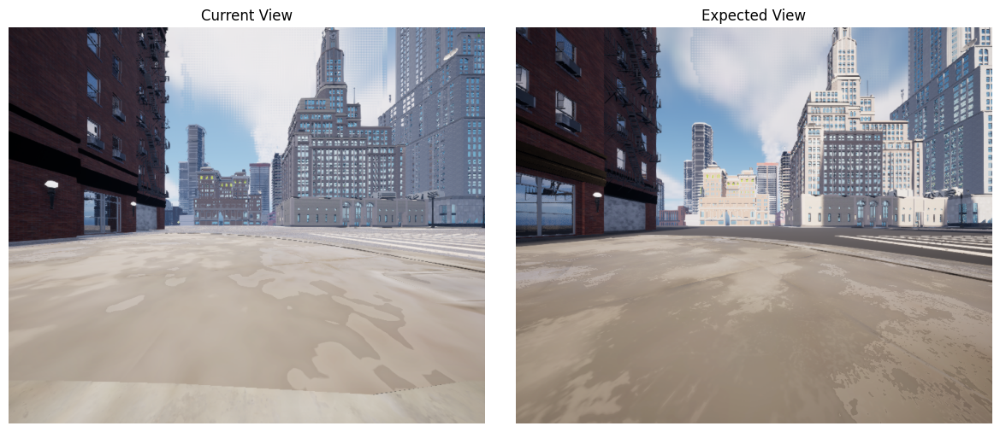

[vision] The current observation reveals a wide, open area with smooth, slightly wet pavement that reflects the sky, indicating recent weather. To the left, a red-brick residential building is partially visible, characterized by its textured surface and multiple black-framed windows. The building features large garage doors on the ground floor, which are essential for vehicle access, and wall-mounted lights that enhance its functionality. The right side of the view is dominated by taller, modern buildings with glass facades, showcasing a mix of architectural styles that contrast with the brick structure. The sky above is partly cloudy, with a light blue hue, contributing to the overall brightness of the scene. Currently, there are no visible obstacles or intersections in the immediate vicinity, allowing for a clear line of sight. However, the red-brick building is not fully visible, and the expected view indicates that it should be more prominent, with the garage doors clearly visible 

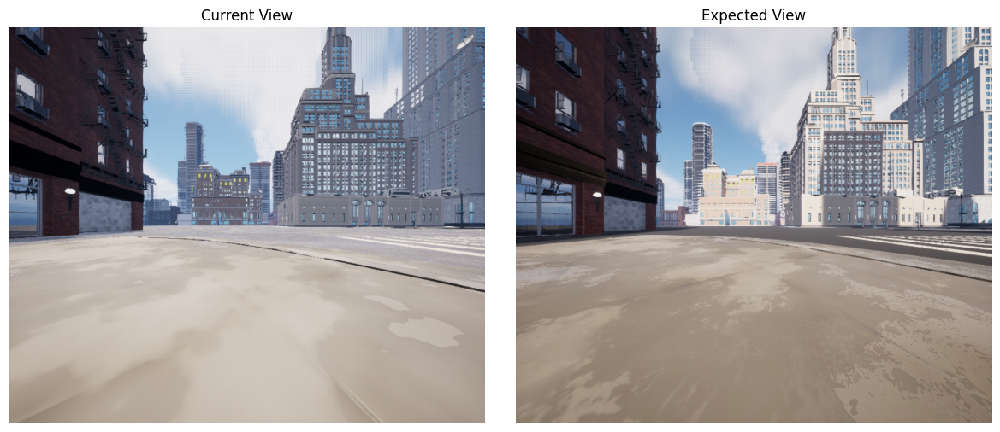

[vision] The current observation reveals a wide, open area with smooth, slightly wet pavement reflecting the sky, indicating recent weather. To the left, a red-brick residential building is partially visible, characterized by its textured surface and multiple black-framed windows. The building features large garage doors on the ground floor, essential for vehicle access, and wall-mounted lights that enhance its functionality. However, the garage doors and surrounding signs for 'MILLWORKS', 'CREEK DELI', and 'FIRE GRILL' are not fully visible, indicating that the robot has not yet reached the intersection. The right side of the view is dominated by taller, modern buildings with glass facades, showcasing a mix of architectural styles that contrast with the brick structure. The sky above is partly cloudy with a light blue hue, contributing to the overall brightness of the scene. Currently, there are no visible obstacles or intersections in the immediate vicinity, allowing for a clear line

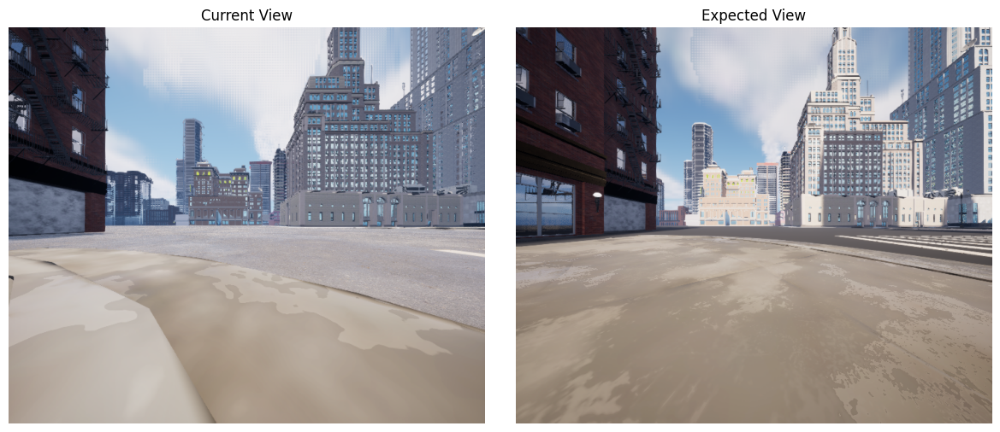

[vision] The current observation reveals a wide, open area with smooth, slightly wet pavement reflecting the sky, indicating recent weather. To the left, a red-brick residential building is partially visible, characterized by its textured surface and multiple black-framed windows. The building features large garage doors on the ground floor, essential for vehicle access, and wall-mounted lights that enhance its functionality. However, the garage doors and surrounding signs for 'MILLWORKS', 'CREEK DELI', and 'FIRE GRILL' are not fully visible, indicating that the robot has not yet reached the intersection. The right side of the view is dominated by taller, modern buildings with glass facades, showcasing a mix of architectural styles that contrast with the brick structure. The sky above is partly cloudy with a light blue hue, contributing to the overall brightness of the scene. Currently, there are no visible obstacles or intersections in the immediate vicinity, allowing for a clear line

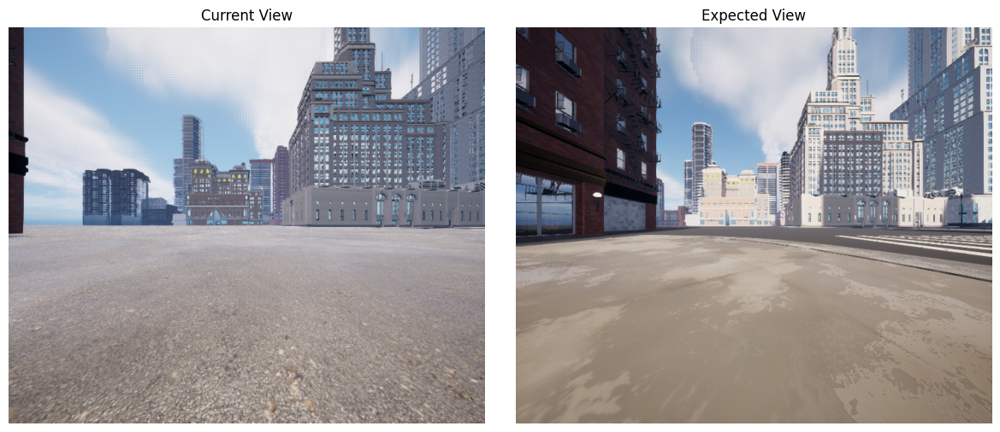

[vision] The current observation reveals a wide, open area with smooth, slightly wet pavement reflecting the sky, indicating recent weather. To the left, a partially visible red-brick residential building is characterized by its textured surface and multiple black-framed windows. The building features large garage doors on the ground floor, essential for vehicle access, and wall-mounted lights that enhance its functionality. However, the garage doors and surrounding signs for 'MILLWORKS', 'CREEK DELI', and 'FIRE GRILL' are not fully visible, indicating that the robot has not yet reached the intersection. The right side of the view is dominated by taller, modern buildings with glass facades, showcasing a mix of architectural styles that contrast with the brick structure. The sky above is partly cloudy with a light blue hue, contributing to the overall brightness of the scene. Currently, there are no visible obstacles or intersections in the immediate vicinity, allowing for a clear line 

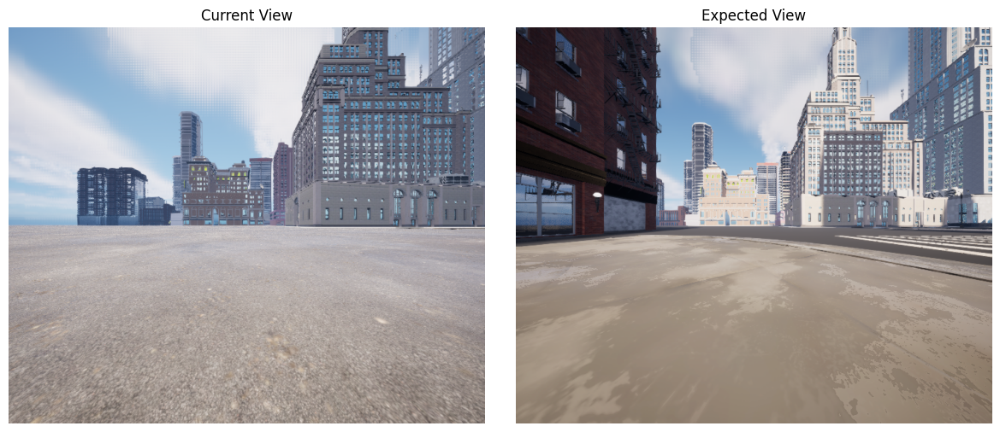

[vision] The current observation reveals a wide, open area with smooth, slightly wet pavement reflecting the sky, indicating recent weather. To the left, a partially visible red-brick residential building is characterized by its textured surface and multiple black-framed windows. The building features large garage doors on the ground floor, essential for vehicle access, and wall-mounted lights that enhance its functionality. However, the garage doors and surrounding signs for 'MILLWORKS', 'CREEK DELI', and 'FIRE GRILL' are not fully visible, indicating that the robot has not yet reached the intersection. The right side of the view is dominated by taller, modern buildings with glass facades, showcasing a mix of architectural styles that contrast with the brick structure. The sky above is partly cloudy with a light blue hue, contributing to the overall brightness of the scene. Currently, there are no visible obstacles or intersections in the immediate vicinity, allowing for a clear line 

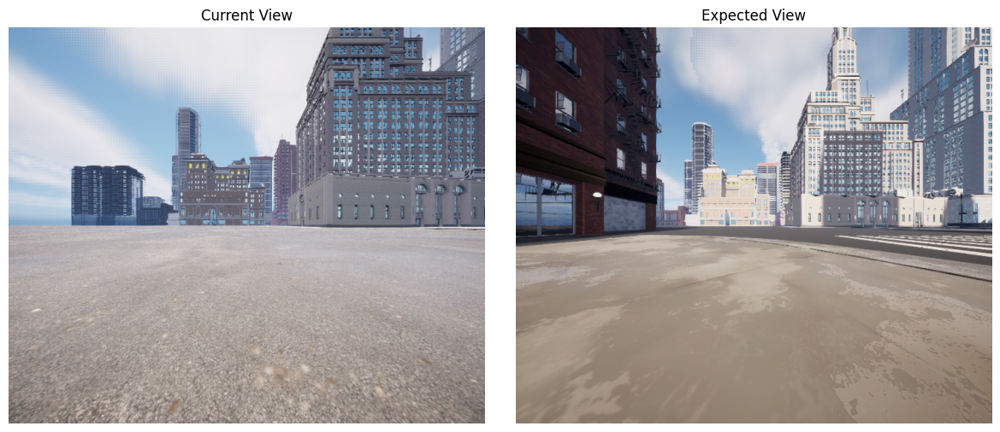

[vision] The current observation reveals a wide, open area with smooth, slightly wet pavement reflecting the sky, indicating recent weather. To the left, a partially visible red-brick residential building is characterized by its textured surface and multiple black-framed windows. The building features large garage doors on the ground floor, essential for vehicle access, and wall-mounted lights that enhance its functionality. However, the garage doors and surrounding signs for 'MILLWORKS', 'CREEK DELI', and 'FIRE GRILL' are not fully visible, indicating that the robot has not yet reached the intersection. The right side of the view is dominated by taller, modern buildings with glass facades, showcasing a mix of architectural styles that contrast with the brick structure. The sky above is partly cloudy with a light blue hue, contributing to the overall brightness of the scene. Currently, there are no visible obstacles or intersections in the immediate vicinity, allowing for a clear line 

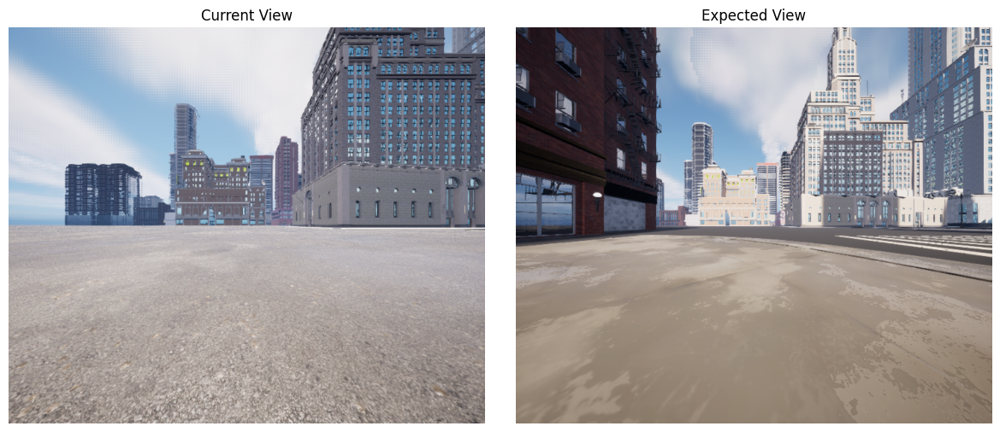

In [ ]:
from utils import action_history_text, numpy_to_base64, split_into_strips, display_images, extract_action_dict
import cv2
import numpy as np
import os

input_tokens = 0
output_tokens = 0

# Align world/task selection style with single_exp
worlds = ["map_road_20_0"]
# Choose task distance similar to single_exp logic (11 for <50)
task_2_test = ["task_dist_11_0_1"]

# Action mapping consistent with single_exp (order matters for history text)
action_mapping = ["Move_Forward", "Rotate_Left", "Rotate_Right", "Move_Left", "Move_Right", "Subtask_Complete"]
# Mapping chosen action index -> env.step discrete index (single_exp pattern)
ACTION_TO_STEP = {0: 0, 1: 5, 2: 4, 3: 2, 4: 3}

for world in worlds:
    reseted = False
    for task in task_2_test:
        task_path = os.path.join("single_agent_world", "total", world, task)
        world_json = os.path.join(task_path, "progen_world.json")
        agent_json = os.path.join(task_path, "task_config.json")
        if not reseted:
            options = {
                "task_path": task_path,
                "agent_json": agent_json,
                "world_json": world_json,
            }
            reseted = True
        else:
            options = {
                "task_path": task_path,
                "agent_json": agent_json,
            }
        observation, info = env.reset(options=options)
        vision_cue = info["current_instruction"]["image"]
        instruction = info["current_instruction"]["text"]
        action_history = []
        chosen_actions = []
        
        summary = """Status: Ready to Start. No obstacles found. No intersections seen. Landmark: unknown (just started)."""
        last_vision_descriptions = ""
        folder_path = os.path.join("log_simple", model, world, task)
        os.makedirs(folder_path , exist_ok=True)

        i = 0
        terminated = False
        last_position = None
        current_position = None
        parse_failure_count = 0

        while not terminated:
            orientation = info['agent']['agent_rotation']
            current_position = info['agent']['agent_location']
            forward_count = sum(1 for a in chosen_actions if a == 0)
            if last_position is not None and forward_count > 3 and np.linalg.norm(np.array(current_position) - np.array(last_position)) < 0.5:
                print("Stuck in place, terminating.")
                with open(os.path.join(folder_path, "LLM_Output.txt"), "a") as llm_logger:
                    llm_logger.write("[STUCK]\n")
                break
            last_position = current_position
            cv2.imwrite(os.path.join(folder_path, f"{i}.png"), observation["rgb"])  # Save current RGB frame

            # Build image list consistent with single_exp (list of dicts with img + description)
            images = []
            if strip:
                strips = split_into_strips(observation["rgb"])
                descs = ['The view on the left', 'The horizontal center', 'The right']
                for idx, strip_img in enumerate(strips):
                    images.append({"img": numpy_to_base64(strip_img), "description": descs[idx] if idx < len(descs) else None})
                images.append({"img": numpy_to_base64(vision_cue), "description": 'The expected view'})
            else:
                images.append({"img": numpy_to_base64(observation["rgb"]), "description": 'The current view'})
                images.append({"img": numpy_to_base64(vision_cue), "description": 'The expected view'})

            # Always add object segmentation last (consistent with earlier notebook intent)
            segment_img = numpy_to_base64(observation["object_mask"]) if "object_mask" in observation else None
            if segment_img is not None:
                images.append({"img": segment_img, "description": 'The object segmentation mask of the current view'})

            # Show images inline (optional visualization)
            display_images(observation["rgb"], vision_cue)

            # Prepare action history text
            action_history_str = action_history_text(action_history, action_mapping)

            # Call ReasoningAgent like single_exp
            try:
                result = agent.step(
                    observation=images,
                    instruction=instruction,
                    orientation=orientation,
                    action_history_text=action_history_str,
                    chosen_actions=chosen_actions,
                )
            except Exception as e:
                print(f"Agent step error: {e}")
                parse_failure_count += 1
                if parse_failure_count > 10:
                    print("Too many perception errors, terminating.")
                    with open(os.path.join(folder_path, "LLM_Output.txt"), "a") as llm_logger:
                        llm_logger.write("[TOO MANY ERRORS]\n")
                    break
                continue

            # Extract standardized outputs
            vision_desc = result.get("vision_description", result.get("Description", ""))
            summary = result.get("summary", result.get("Summary", summary))
            match = result.get("match", result.get("Match"))
            chosen_actions = result.get("actions", result.get("Actions"))
            reason = result.get("reason") or result.get("Reason")
            usage = result.get("usage", {"input": 0, "output": 0})
            input_tokens += usage.get("input", 0)
            output_tokens += usage.get("output", 0)

            print("[vision]", vision_desc)
            if reason:
                print("[reason]", reason)

            # Log to file
            with open(os.path.join(folder_path, "LLM_Output.txt"), "a") as llm_logger:
                llm_logger.write("[current subtask]" + instruction + '\n')
                llm_logger.write(f"[vision {i}]" + str(vision_desc).replace("\n", "") + '\n')
                if reason:
                    llm_logger.write(f"[reason {i}]" + str(reason).replace("\n", "") + '\n')
                llm_logger.write(f"[summary {i}]" + str(summary).replace("\n", "") + '\n')
                llm_logger.write(f"[actions {i}]" + str(chosen_actions) + '\n')
                llm_logger.write(f"[match {i}]" + str(match) + '\n')

            if not chosen_actions:
                print("No action specified. Failing.")
                break

            # Execute chosen actions
            for chosen_action in chosen_actions:
                action_history.append(chosen_action)
                i += 1
                if chosen_action == -1:
                    observation, _, terminated, _, info = env.step(-1)
                    if terminated:
                        print("End")
                        break
                    instruction = info["current_instruction"]["text"]
                    vision_cue = info["current_instruction"]["image"]
                    action_history = []
                else:
                    step_code = ACTION_TO_STEP.get(chosen_action)
                    if step_code is None:
                        continue
                    observation, _, terminated, _, info = env.step(step_code)
            if terminated:
                print("End")
                break

In [ ]:
env.close()